# Algorithmic Differentiation Example

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


In [2]:
import torch
from torch import nn
from torch.utils.data import DataLoader

# from torchvision import datasets
# from torchvision.transforms import ToTensor

from torch.utils.data import Dataset
from torch.utils.data import random_split
from torch.utils.tensorboard import SummaryWriter

In [3]:
import sys

sys.path.append("../CODE/TorchLearning")

import charts



## Dense Model:



In [ ]:

class DenseModel(nn.Module):
    def __init__(self, num_inputs, num_hidden_layers, num_neurons_per_hidden_layer, dtype=torch.float64):
        super().__init__()

        layers = []
        in_features = num_inputs

        for _ in range(num_hidden_layers):
            layers.append(nn.Linear(in_features, num_neurons_per_hidden_layer, dtype=dtype))
            layers.append(nn.Softplus())
            in_features = num_neurons_per_hidden_layer

        layers.append(nn.Linear(in_features, 1, dtype=dtype))
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)


## Differential deep learning model

In [5]:
class DiffDeepLearning(nn.Module):
    def __init__(self, model):
        super(DiffDeepLearning, self).__init__()
        
        self.model = model

    def forward(self, x):

        y = self.model(x)
        grad = torch.autograd.grad(y, x, grad_outputs=torch.ones_like(y), create_graph=True)[0]

        return torch.concatenate([y, grad], dim=1)


# Custon dataset

In [6]:
class DiffDeepLearningDataset(Dataset):
    def __init__(self, x_file, y_file):
        # Class constructor:
        # Loads the dataset from files:

        X = np.load(x_file)
        y = np.load(y_file)

        self.X_mu = np.mean(X, axis = 0)
        self.X_sigma = np.std(X, axis = 0) + 1e-8

        self.y_mu = np.mean(y[:,0])
        self.y_sigma = np.std(y[:,0]) + 1e-8

        y[:,1:] *= self.X_sigma / self.y_sigma  

        self.dydX_scaled_L2_norm = np.mean(y[:,1:]*y[:,1:], axis = 0) + 1e-8

        self.X = torch.tensor((X - self.X_mu) / self.X_sigma, dtype=torch.float64) 
        self.y = torch.tensor((y - self.y_mu) / self.y_sigma, dtype=torch.float64)

        
        self.len = self.X.shape[0]

        

    def __getitem__(self, index):
        # Retrieves an item from the dataset:
        # In very big daytasets, we should not load all data at once.

        return self.X[index], self.y[index]
    
        
    def __len__(self):
        # Returns the length of the dataset:
        return self.len

## Loss function

In [7]:
class DiffLearningLoss(nn.Module):
    
    def __init__(self, alpha, dydX_scaled_L2_norm):

        super().__init__()

        self.alpha = alpha

        norm_t = torch.as_tensor(dydX_scaled_L2_norm, dtype=torch.float64) 
        self.register_buffer("dydX_scaled_L2_norm", norm_t)

    def forward(self, pred, target):

        return torch.nn.functional.mse_loss(pred[:,0],target[:,0]) + self.alpha * torch.mean(torch.square(pred[:,1:]-target[:,1:])/self.dydX_scaled_L2_norm)

## Full model

In [8]:
class DiffLearningFullModel:

    def __init__(self, num_inputs, num_hidden_layers, num_neurons_per_hidden_layer, alpha, train_dataloader, val_dataloader = None):
        
        self.model = DiffDeepLearning(DenseModel(num_inputs, num_hidden_layers, num_neurons_per_hidden_layer, torch.float64))

        self.alpha = alpha

        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=0.01)
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader

        self.get_normalization_params_set_loss()

        

    def get_normalization_params_set_loss(self):

        self.X_mu = self.train_dataloader.dataset.X_mu
        self.X_sigma = self.train_dataloader.dataset.X_sigma

        self.y_mu = self.train_dataloader.dataset.y_mu
        self.y_sigma = self.train_dataloader.dataset.y_sigma 

        self.dydX_scaled_L2_norm = self.train_dataloader.dataset.dydX_scaled_L2_norm

        self.loss_fn = DiffLearningLoss(self.alpha, self.train_dataloader.dataset.dydX_scaled_L2_norm)


    def train(self, epochs, writer=None):

        
        for epoch in range(epochs):
            self.model.train()
            train_loss = 0.0
            for batch, (X, y) in enumerate(self.train_dataloader):
                X = X.requires_grad_(True)
                pred = self.model(X)
                loss = self.loss_fn(pred, y)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                train_loss += loss.item()
            train_loss /= len(self.train_dataloader)

            self.model.eval()
            val_loss = 0.0
            with torch.set_grad_enabled(True):
                for X, y in self.val_dataloader:
                    X = X.requires_grad_(True)
                    pred = self.model(X)
                    loss = self.loss_fn(pred, y)
                    val_loss += loss.item()
            val_loss /= len(self.val_dataloader)

            if writer:
                writer.add_scalar('Loss/train', train_loss, epoch)
                writer.add_scalar('Loss/val', val_loss, epoch)

            print(f'Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')

    def forward(self, X):

        X_scaled = ((X - self.X_mu) / self.X_sigma)

        X_scaled.requires_grad_(True)

        y_sens_scaled_predicted = self.model.forward(X_scaled).detach().numpy()

        y = self.y_mu +  y_sens_scaled_predicted[:,0]*self.y_sigma

        sens = y_sens_scaled_predicted[:,1:] * self.y_sigma / self.X_sigma  

        return {'y': y, 'sens': sens}

## Test diff model sensitivities

tensor([[-3.5845e-01, -5.9339e-03, -1.3874e-02, -1.4144e-03,  8.9909e-03,
          3.8916e-03],
        [-3.6010e-01, -5.0432e-03, -1.3582e-02,  3.1896e-05,  7.7147e-03,
          3.2596e-03],
        [-3.6180e-01, -6.3992e-03, -1.3917e-02, -1.3001e-03,  9.0309e-03,
          3.6141e-03],
        [-3.5568e-01, -5.4564e-03, -1.3625e-02, -1.1000e-03,  8.4538e-03,
          3.7008e-03],
        [-3.5894e-01, -5.6500e-03, -1.3670e-02, -1.2719e-03,  8.6217e-03,
          3.7687e-03],
        [-3.5653e-01, -5.5908e-03, -1.3760e-02, -7.2700e-04,  8.4731e-03,
          3.5409e-03],
        [-3.5249e-01, -5.6734e-03, -1.3851e-02, -1.2421e-03,  8.8431e-03,
          4.1319e-03],
        [-3.5282e-01, -5.9404e-03, -1.4159e-02, -1.1346e-03,  9.2637e-03,
          3.9508e-03],
        [-3.6124e-01, -6.3208e-03, -1.4021e-02, -9.1433e-04,  8.9480e-03,
          3.5412e-03],
        [-3.6005e-01, -6.6679e-03, -1.4257e-02, -1.1798e-03,  9.3550e-03,
          3.7792e-03]], dtype=torch.float64, grad_fn=

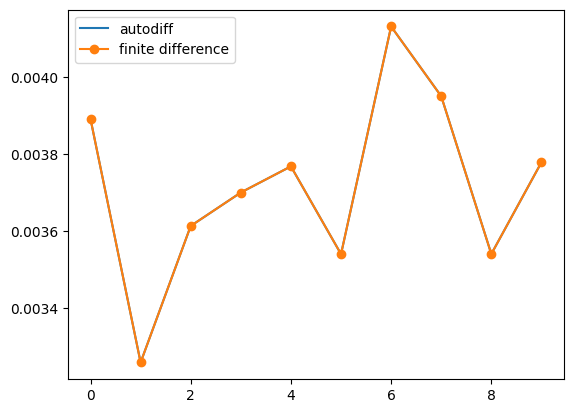

In [9]:
model = DenseModel(num_inputs=5, num_hidden_layers=3, num_neurons_per_hidden_layer=64)

algdiffmodel = DiffDeepLearning(model)


x = torch.rand(10, 5, dtype=torch.float64, requires_grad=True)

y = algdiffmodel(x)

print(y)

col = 4
ep = 1e-6

x__ = x.clone()

x__[:, col] += torch.tensor(ep)

y2 = algdiffmodel(x__)

test = (y2[:, 0] - y[:, 0]) / ep

print(test)

plt.plot(y[:,col+1].detach().numpy(), label='autodiff')

plt.plot(test.detach().numpy(), label='finite difference', marker='o')

plt.legend()

torch.save(algdiffmodel, "../MODELS/algdiffmodel.pth")

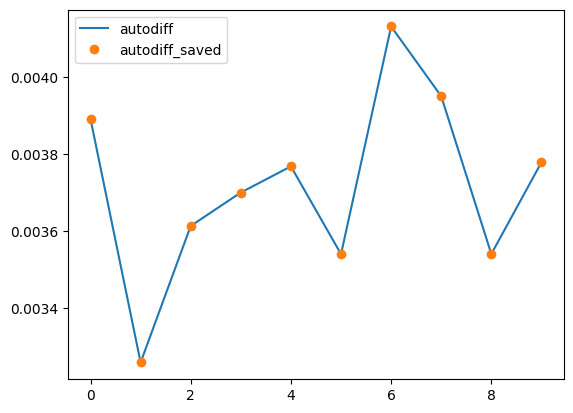

In [10]:
saved_dense = torch.load("../MODELS/algdiffmodel.pth", weights_only=False)

y_saved = saved_dense(x) 

plt.plot(y[:,col+1].detach().numpy(), label='autodiff')
plt.plot(y_saved[:,col+1].detach().numpy(), 'o',label='autodiff_saved')
plt.legend()




## Train model


### Sample data

In [19]:
ep = 0.3 # error term
num = 40000 #num poins

X = np.random.uniform(-4*np.pi,4*np.pi, (num,1))
Y = np.random.uniform(-4*np.pi,4*np.pi, (num,1))

XXX = np.hstack((X,Y))




X_torch = torch.tensor(X, dtype= torch.float64, requires_grad=True)
Y_torch = torch.tensor(Y, dtype= torch.float64, requires_grad=True)


Z = torch.sin(torch.sqrt(X_torch**2+Y_torch**2))+ ep*torch.randn((num,1))

print(Z)

Z.sum().backward()

print(X_torch.grad)

Z= Z.detach().numpy()

Z = np.concatenate((Z, X_torch.grad.numpy(), Y_torch.grad.numpy())      , axis=1) 

np.save('../DATA/x2d_train.npy', XXX[0:32000,:])
np.save('../DATA/y2d_train.npy', Z[0:32000,:])
np.save('../DATA/x2d_test.npy', XXX[32000:,:])
np.save('../DATA/y2d_test.npy', Z[32000:,:])

df = pd.DataFrame({
    "x": XXX[:,0],
    "y": XXX[:,1],
    "z": Z[:,0],
    "dz_dx": Z[:,1], "dz_dy": Z[:,2]
})

df[['x','y', 'z']]





tensor([[ 0.9298],
        [ 0.9483],
        [-0.9672],
        ...,
        [ 0.9841],
        [-0.4959],
        [-0.6702]], dtype=torch.float64, grad_fn=<AddBackward0>)
tensor([[-0.2162],
        [-0.5193],
        [ 0.2030],
        ...,
        [ 0.0140],
        [ 0.9734],
        [-0.6153]], dtype=torch.float64)


,x,y,z
0,-3.477724,6.506283,0.929818
1,-6.827403,2.492802,0.948286
2,9.946529,-5.206415,-0.967245
3,-5.407980,-6.457023,0.630842
4,-5.638770,0.843815,-0.898520
...,...,...,...
39995,6.998619,10.140632,-0.045219
39996,-10.996685,2.346301,-0.902907
39997,-5.002691,-6.083073,0.984096
39998,12.261927,1.714589,-0.495867


In [20]:
f = charts.plot_3d_scatter(df, 'x', 'y', 'dz_dx')

charts.plot_3d_scatter(df, 'x', 'y', 'dz_dy', f, color = 'red')

charts.plot_3d_scatter(df, 'x', 'y', 'z', f, color = 'green')

f.show()


### Data set

In [21]:
train_dataset = DiffDeepLearningDataset('../DATA/x2d_train.npy', '../DATA/y2d_train.npy')
test_dataset = DiffDeepLearningDataset('../DATA/x2d_test.npy', '../DATA/y2d_test.npy')  


In [22]:
model = DiffLearningFullModel(num_inputs=2, num_hidden_layers=3, num_neurons_per_hidden_layer=64, alpha=5.0, 
                            train_dataloader=DataLoader(train_dataset, batch_size=64, shuffle=True), 
                            val_dataloader=DataLoader(test_dataset, batch_size=test_dataset.__len__()))


model.train(epochs=50)

Epoch 1, Train Loss: 9.5517, Val Loss: 9.3353
Epoch 2, Train Loss: 9.0385, Val Loss: 8.1733
Epoch 3, Train Loss: 7.6991, Val Loss: 6.5234
Epoch 4, Train Loss: 2.9215, Val Loss: 1.8357
Epoch 5, Train Loss: 1.3798, Val Loss: 0.7957
Epoch 6, Train Loss: 0.4735, Val Loss: 0.5848
Epoch 7, Train Loss: 0.3869, Val Loss: 0.5317
Epoch 8, Train Loss: 0.3947, Val Loss: 0.4908
Epoch 9, Train Loss: 0.3799, Val Loss: 0.4686
Epoch 10, Train Loss: 0.3844, Val Loss: 0.4621
Epoch 11, Train Loss: 0.3606, Val Loss: 0.4311
Epoch 12, Train Loss: 0.3688, Val Loss: 0.4808
Epoch 13, Train Loss: 0.3601, Val Loss: 0.4663
Epoch 14, Train Loss: 0.3520, Val Loss: 0.5474
Epoch 15, Train Loss: 0.3536, Val Loss: 0.4836
Epoch 16, Train Loss: 0.3645, Val Loss: 0.4328
Epoch 17, Train Loss: 0.3464, Val Loss: 0.4012
Epoch 18, Train Loss: 0.3637, Val Loss: 0.4995
Epoch 19, Train Loss: 0.3422, Val Loss: 0.4294
Epoch 20, Train Loss: 0.3496, Val Loss: 0.5333
Epoch 21, Train Loss: 0.3359, Val Loss: 0.4538
Epoch 22, Train Loss: 

In [23]:
def f(x, y):
    return np.sin(np.sqrt(x**2 + y**2))

fig = charts.plot_3d_scatter(df, 'x', 'y', 'z', color = 'green')



charts.plot_surface_with_contours(f, x_min=-4*np.pi, x_max=4*np.pi, y_min=-4*np.pi, y_max=4*np.pi, n_points=150, color="black", fig=fig)
fig.show()

In [26]:
ff = lambda x, y: model.forward(torch.tensor(np.hstack((x.reshape(-1,1), y.reshape(-1,1))), dtype=torch.float64))['y']



fig = charts.plot_surface_with_contours(ff, x_min=-4*np.pi, x_max=4*np.pi, y_min=-4*np.pi, y_max=4*np.pi, n_points=150, color="orange", fig=fig)

fig.show()

/var/folders/xn/_mx5kwl91_gbzwmp3ykmn2b80000gn/T/ipykernel_8781/3706198109.py:64: DeprecationWarning:

__array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)

